# FIFO (Random Replacement)

In [1]:
import random 
import matplotlib.pyplot as plt
import numpy as np

In [2]:

def generate_referenceString(length,process_size):
    string = []
    for i in range(length):
        n = random.randint(0,process_size-1)
        string.append(n)
    return string




def BeladyAnomaly(reference_string, proc_size):

    page_faults = []

    for i in range(2,proc_size):
        frame_size = i
        queue = []
        temp_page_faults = 0
        for j in range(len(reference_string)):
            if reference_string[j] in queue:
                continue 
            else:
                temp_page_faults += 1
                if(len(queue) < frame_size):
                    queue.append(reference_string[j])
                else:
                    index = random.randint(0,frame_size-1)
                    queue.pop(index)
                    queue.append(reference_string[j])
        page_faults.append(temp_page_faults)
            
    return page_faults
        
    



In [3]:
BeladyAnomaly([0,1,5,3,0,1,4,0,1,5,3,4], 20)

[11, 9, 6, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5]

Belady's anomaly occurs because when we increase frame size, the page faults should decrease but in some cases it increases.
Now for different reference string lengths, we will be checking the bumps, i.e, belady anomaly occurence and plot the graph of the number of belady's anomaly 

Reference String lenghts vary from 25 to 12800

In [4]:

anomaly_string = np.zeros((5,10), dtype = int)
bumps_arr = np.zeros((5,10), dtype = int)

In [5]:
rsl = 25
all_bumps_arr = []
anomalous_strings = []
m = 0

while(rsl<=12800):

    l = 0
    #-------------------------------------------------------------------------------------
    for proc_size in range(20,120, 20):
        anomalous_stringcounts = 0
        total_bumps = 0
        #----------------------------------------------------------------------------------------------
        for j in range(1000): # taking 1000 random reference strings
           
            reference_string = generate_referenceString(rsl,proc_size)
            
            page_faults = BeladyAnomaly(reference_string, proc_size)
            
            bumps = 0
            for i in range(len(page_faults)-1):
                if page_faults[i] < page_faults[i+1]:
                    bumps = bumps+1
            print(page_faults)
            print(bumps)
            
            
            if(bumps>0):
                anomalous_stringcounts += 1
                total_bumps += bumps
        
        
        
        #-----------------------------------------------------------------------------------------------    
        anomaly_string[l][m] = anomalous_stringcounts 
        bumps_arr[l][m] = total_bumps
        l += 1
        
    
    m = m+1
            
    rsl = rsl * 2



[22, 20, 22, 18, 16, 17, 17, 17, 15, 14, 14, 14, 14, 14, 14, 14, 14, 14]
2
[23, 23, 22, 23, 18, 19, 17, 19, 18, 17, 17, 17, 17, 17, 17, 17, 17, 17]
3
[23, 19, 20, 18, 19, 18, 17, 15, 17, 15, 16, 15, 15, 15, 15, 15, 15, 15]
4
[22, 22, 21, 19, 20, 20, 15, 18, 17, 14, 14, 13, 13, 13, 13, 13, 13, 13]
2
[23, 22, 22, 20, 21, 19, 18, 18, 18, 17, 18, 16, 16, 16, 16, 16, 16, 16]
2
[24, 24, 23, 21, 19, 17, 17, 16, 16, 16, 17, 15, 15, 15, 15, 15, 15, 15]
1
[21, 19, 19, 18, 19, 18, 16, 16, 16, 15, 15, 15, 15, 15, 15, 15, 15, 15]
1
[24, 25, 21, 23, 20, 19, 20, 17, 17, 17, 18, 17, 16, 16, 16, 16, 16, 16]
4
[22, 20, 19, 21, 20, 19, 17, 17, 15, 17, 15, 15, 15, 15, 15, 15, 15, 15]
2
[24, 21, 22, 21, 21, 21, 19, 17, 16, 17, 15, 16, 15, 15, 15, 15, 15, 15]
3
[21, 18, 18, 17, 17, 17, 17, 16, 15, 16, 15, 15, 15, 15, 15, 15, 15, 15]
1
[23, 22, 21, 20, 20, 19, 17, 17, 17, 16, 15, 15, 15, 15, 15, 15, 15, 15]
0
[20, 19, 21, 18, 16, 15, 14, 14, 13, 12, 12, 12, 12, 12, 12, 12, 12, 12]
1
[25, 24, 23, 22, 21, 20, 

In [6]:
print(anomaly_string)

[[ 932  974  950  723  319   55    1    0    0    0]
 [ 983 1000 1000 1000 1000  937  571  128    2    0]
 [ 978 1000 1000 1000 1000 1000  996  820  226    8]
 [ 937 1000 1000 1000 1000 1000 1000  997  844  197]
 [ 908 1000 1000 1000 1000 1000 1000 1000  995  720]]


In [7]:
print(bumps_arr)

[[ 2017  2820  2322  1161   365    55     1     0     0     0]
 [ 2951  6394  8562  7617  5180  2555   816   130     2     0]
 [ 3061  7839 13212 14960 12671  8542  4468  1605   247     8]
 [ 2785  8725 16413 21670 20894 16093 10431  5411  1715   223]
 [ 2662  9078 18694 27173 29171 24554 17983 10845  4658  1223]]


In [8]:
x = [25,50,100,200,400,800,1600,3200,6400,12800]
print(len(x))

10


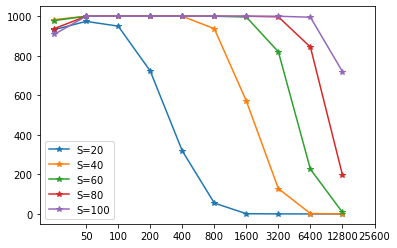

In [9]:
m = 20
for i in range(5):
    temp_str = "S=" + str(m)
    plt.plot(anomaly_string[i], "*-", label = temp_str)
    m = m+20

x = []
t = 25
while t <= 12800:
    x.append(t*2)
    t = t*2
    
xi = list(range(1,len(x)+1))
plt.xticks(xi,x)

plt.legend()
plt.show()

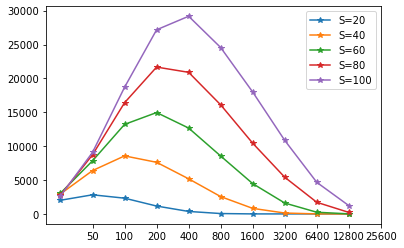

In [10]:
m = 20
for i in range(5):
    temp_str = "S=" + str(m)
    plt.plot(bumps_arr[i], "*-",label = temp_str)
    m = m+20

x = []
t = 25
while t <= 12800:
    x.append(t*2)
    t = t*2
    
xi = list(range(1,len(x)+1))
plt.xticks(xi,x)

plt.legend()
plt.show()